<a href="https://colab.research.google.com/github/HeshanDissanayake/SIIM_ISIC_melanoma_classification/blob/main/ModelVisualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!curl 'https://storage.googleapis.com/kaggle-data-sets/687793%2F1205903%2Fcompressed%2F640x640.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1592875697&Signature=HZmQx4ZjeGv%2BFiXn3Qr8vzLYBZaXKxEo7hZsnI8hnd7eb4uCABzcKviYojoipd16Lco6NZu0Jkm%2Bscyhu67sx6Rw8Wu0lMT6jx2rNJKWHSWgmaDhHF47Ki1PvX8b5sUQzX5Vx6eE5yPeuTNmOE5ZPFBwAiOBU%2FsfYwNkejmK9w51aLFZLEgBwQKYg2ZgE3lWJmPz%2BFnKGUyJO%2Fc2sOHl8SSxGgAMBxgfNEP1XUxRDFwFuAN69oMFMbMydNtiyjZIMbTFJArMfpPLSb4hwt%2Fi3CJbV4Eviwp1Jh8Q%2FQTHTw%2FUox3fwa8PG%2Bp0l9YY0ONZth0zXvXAPSAihS4r1plWLQ%3D%3D' -H 'User-Agent: Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:77.0) Gecko/20100101 Firefox/77.0' -H 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,*/*;q=0.8' -H 'Accept-Language: en-US,en;q=0.5' --compressed -H 'Referer: https://www.kaggle.com/' -H 'Connection: keep-alive' -H 'Cookie: cuntwars_user_id=xXNhMHwAmW; _ga=GA1.3.1485321816.1568920993' -H 'Upgrade-Insecure-Requests: 1' -H 'TE: Trailers' -o cancer.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1568M  100 1568M    0     0  41.8M      0  0:00:37  0:00:37 --:--:-- 45.3M


In [ ]:
!unzip cancer.zip

In [ ]:
import os
import sys
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from shutil import copy
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, add, Dropout, Flatten, Dense, Reshape, GaussianNoise
from tensorflow.keras.models import Model
from zipfile import ZipFile
import sys
from tensorflow.keras.models import Sequential, load_model
from  tensorflow import keras
from tensorflow.keras import regularizers

In [ ]:
model = load_model("/content/drive/My Drive/cancer/models/autoencoder_noise_input/epoch_49.h5")

In [ ]:
from tensorflow.keras.applications.vgg19 import VGG19
model = VGG19()

574717952/574710816 [==============================] - 13s 0us/step


In [ ]:
outs = [layer.output for layer in model.layers]


In [ ]:
outModel = Model(model.input, outs)

In [ ]:
outModel.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [ ]:
img = plt.imread('/content/train/ISIC_0074268.jpg')
img = cv2.resize(img, (224,224)).reshape(1,224,224,3)
outputs = outModel.predict(img)

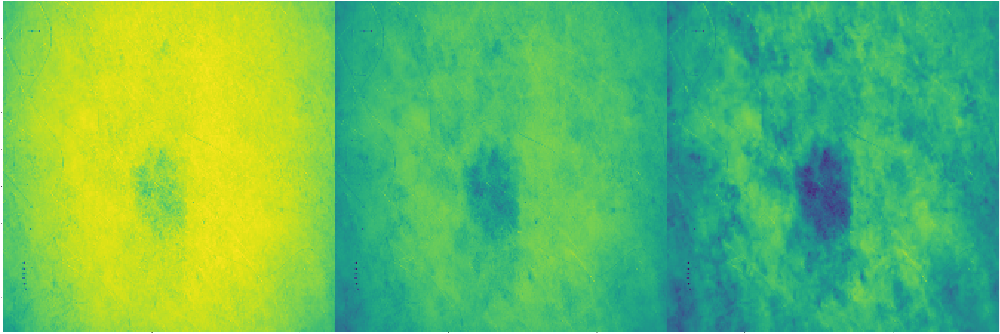

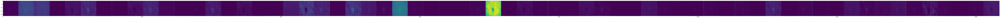

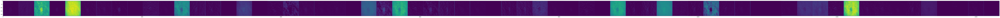

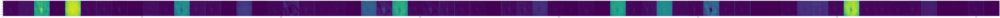

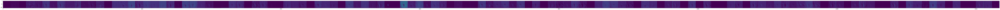

...

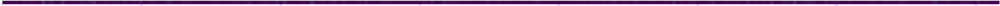

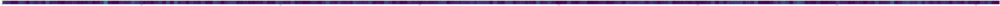

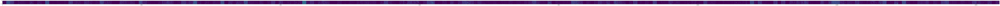

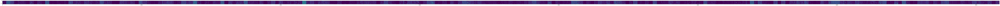

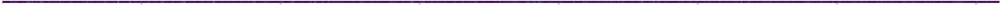

In [ ]:
layer_limit = 12
for i,out in enumerate(outputs):
  if len(out[0].shape)==3:
    Num_filters = out[0].shape[2]
    width = out[0].shape[1]

    canvas = np.zeros((width, width*Num_filters))
    for j in range(Num_filters):
      canvas[:,j*width:(j+1)*width] = out[0][:,:,j]
    
    plt.figure(figsize=(200,400))
    cv2.imwrite('/content/imgs/layer_%d.jpg'%i, canvas)
    plt.imshow(canvas)
    plt.show()  
  if i == layer_limit:
    break